<a href="https://colab.research.google.com/github/anirudh-grack/Employee-App-DevOps-Training/blob/Topics_in_AI/Imagecap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
tensorboard = TensorBoard(log_dir="/content/drive/MyDrive/ImageCaptioning/final_train/logs/")


In [ ]:
os.makedirs('kaggle/input/flicker8k')
os.makedirs('kaggle/working')
BASE_DIR='/content/kaggle/input/flicker8k'
WORKING_DIR='/content/kaggle/working'

In [ ]:
!unzip '/content/drive/MyDrive/ImageCaptioning/archive.zip' -d '/content/kaggle/input/flicker8k'

Streaming output truncated to the last 5000 lines.
  inflating: /content/kaggle/input/flicker8k/Images/2844846111_8c1cbfc75d.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2844963839_ff09cdb81f.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2845691057_d4ab89d889.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2845845721_d0bc113ff7.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2846037553_1a1de50709.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2846785268_904c5fcf9f.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2846843520_b0e6211478.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2847514745_9a35493023.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2847615962_c330bded6e.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2847859796_4d9cb0d31f.jpg  
  inflating: /content/kaggle/input/flicker8k/Images/2848266893_9693c6

In [ ]:
# load vgg16 model
model = VGG16()

# restructure the model
model = Model(inputs=model.inputs, outputs=model.layers[-2].output) #  not taking in consideration the fully connected layer, just using previous layers to extract the feature results

# summarize
print(model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
from posix import listdir
# extract features from image
features = {}
directory = os.path.join(BASE_DIR,'Images')

for img_name in tqdm(os.listdir(directory)):
  # load the image from file
  img_path = directory+'/'+img_name
  image = load_img(img_path, target_size=(224,224))

  # convert image pixels to numpy array
  image = img_to_array(image)

  # reshape data for model
  image = image.reshape((1,image.shape[0], image.shape[1],image.shape[2]))

  # preprocess image for vgg
  image = preprocess_input(image)

  # extract features
  feature = model.predict(image, verbose=0)

  # get image ID
  image_id = img_name.split('.')[0] # removing the jpg extension

  # store feature
  features[image_id] = feature


  0%|          | 0/8091 [00:00<?, ?it/s]

NameError: ignored

In [ ]:
# Store features in pickle
pickle.dump(features, open(os.path.join(WORKING_DIR,'features_vgg16.pkl'),'wb'))

NameError: ignored

In [ ]:
!cp '/content/kaggle/working/features_vgg16.pkl' '/content/drive/MyDrive/ImageCaptioning/' # storing pkl file in the drive

In [ ]:
!cp '/content/drive/MyDrive/ImageCaptioning/features_vgg16.pkl' '/content/kaggle/working/'  # storing pkl file in the drive

In [ ]:
# Load features from pickle
with open("/content/drive/MyDrive/ImageCaptioning/features_vgg16.pkl",'rb') as f:
  features_vgg16 = pickle.load(f)

In [ ]:
with open(os.path.join(BASE_DIR, 'captions.txt'),'r') as f:
  next(f) # as first line of captions.txt contains heading
  captions_doc = f.read()

In [ ]:
captions_doc

'1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg,A girl going into a wooden building .\n1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .\n1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .\n1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .\n1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting\n1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .\n1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .\n1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .\n1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .\n1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .\n1002674143_1b742ab4b8.j

In [ ]:
# create mapping of image to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
  # split the line by comma(,)
  tokens = line.split(',')
  if len(line) < 2:
    continue # just to tackle exception in case if there either 0 or just 1 word it's an error/unwanted caption

  image_id, caption = tokens[0],tokens[1:] # tokens[1:] is used instead of tokens[1] therefore caption will still be in a list of size 1

  # remove extension from image ID
  image_id = image_id.split('.')[0]

  # convert caption list to string
  caption = " ".join(caption) #  doing this will eliminate any possibility of having redundant spaces in tha caption

  # create list if needed
  if image_id not in mapping:
    mapping[image_id]=[]

  # store the caption
  mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [ ]:
mapping["1000268201_693b08cb0e"]

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
len(mapping)

8091

**data preprocessing**

In [ ]:
def clean(mapping):
  for key, captions in mapping.items():
    for i in range(len(captions)):
      # take one caption at a time
      caption = captions[i]

      # preprocessing steps
      # 1. convert to lower case
      caption = caption.lower()

      # 2. remove digits, special characters etc..
      caption = caption.replace('[^A-Za-z]','') # except of characters remove everything

      # 3. delete additional spaces
      caption = caption.replace('\s',' ')

      # 4. add start and end tags to the caption, and also removing all words of length 1
      caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
      captions[i] = caption

In [ ]:
# preprocess the text
clean(mapping)

In [ ]:
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [ ]:
all_captions = []
for key in mapping:
  for caption in mapping[key]:
    all_captions.append(caption)

In [ ]:
len(all_captions) # around 5 captions for each image

40455

In [ ]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [ ]:
# tokenize the text
tokenizer = Tokenizer()
'''
caption = 'startseq child in pink dress is climbing up set of stairs in an entry way endseq'
The texts_to_sequences method takes a list of texts as input and returns a list of sequences, where each sequence is a list of integers representing the words in the corresponding text.
In this case, the input is a list containing a single preprocessed caption.
Since texts_to_sequences returns a list of sequences, [0] is used to extract the first (and only) sequence from the list.
The resulting seq is now a list of integers representing the words in the caption.
Suppose the vocabulary mapping is:
{
  'startseq': 1, 'child': 2, 'in': 3, 'pink': 4, 'dress': 5, 'is': 6, 'climbing': 7,  'up': 8,  'set': 9,  'of': 10,  'stairs': 11,  'an': 12,  'entry': 13,  'way': 14,  'endseq': 15
}
seq = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
  '''
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index)+1 # len(tokenizer.word_index) gives us the total number of unique words in the vocab

In [ ]:
vocab_size

8485

In [ ]:
# get maximum length of the caption available, as it will be usefule to pad the sequences
max_length = max(len(caption.split()) for caption in all_captions)
max_length

35

**Train Test Split**

In [ ]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90) # Using 90% of the data for training and remaining for testing
train = image_ids[:split]
test = image_ids[split:]

In [ ]:
# Create data generator to get data in batch (avoid session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
  # loop over images
  X1, X2, y = list(), list(), list() # X1-> Image Features, X2-> Word Features, y-> caption
  n=0
  while 1:
    for key in data_keys: # data_keys is the list of image_ids in train data set
      n+=1
      captions = mapping[key] # getting list of captions for the respective image id
      # process each caption
      for caption in captions:
        # encode the sequence
        seq = tokenizer.texts_to_sequences([caption])[0] # ?

        # split the sequence into X, y pairs
        for i in range(1, len(seq)):
          # Split into input and output pairs
          in_seq, out_seq = seq[:i], seq[i]

          # pad input sequence
          in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
          # Here maxlen=max_length means padding for input seq depends on max length that is 35
          # encode output sequence # Here also we are doing padding that is equal to vocab size = 8485 !!!!!!!
          out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

          # store the sequences
          X1.append(features[key][0]) # image features and here key is the data_keys is the list of image_ids in train data set which itself made from dictionary named mapping using mapping.keys() to get image ids
          X2.append(in_seq) # word features
          y.append(out_seq)

      if n==batch_size:
        X1,X2,y=np.array(X1),np.array(X2),np.array(y)
        yield [X1, X2], y
        # just re-initializing as otherwise we will exhaust the memory
        X1, X2, y = list(), list(), list()
        n=0


**Model Creation**

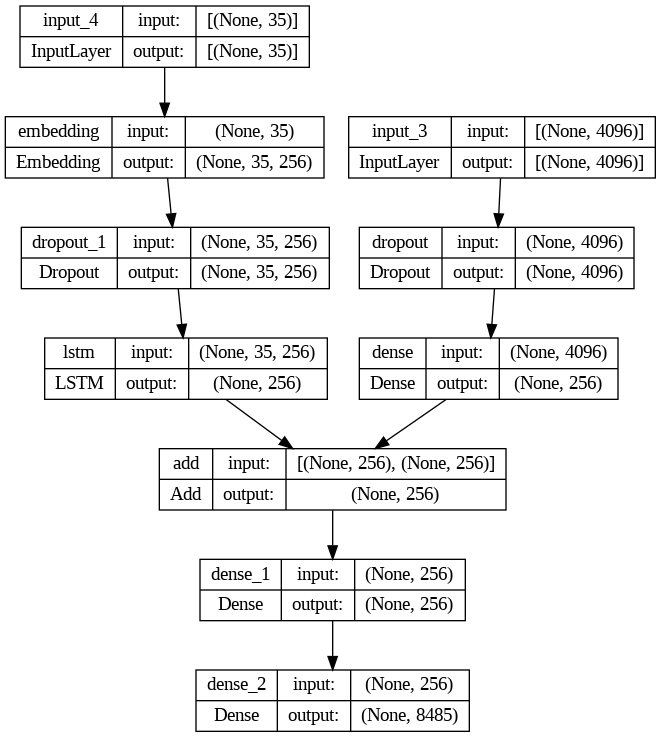

In [ ]:
# Encoder Model
# Image feature layers
inputs1 = Input(shape=(4096)) # 4096 features we are getting as output from the VGG model above that we can check in the last layer of the summary
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# Sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2) # embedding of size 256
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)


# Decoder Model
decoder1 = add([fe2, se3]) # concatenating the features very important step
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1,inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# plot the model
plot_model(model, show_shapes=True)

In [ ]:
# train the model
epochs = 20
batch_size = 16
steps = len(train) // batch_size
%load_ext tensorboard
%tensorboard --logdir="/content/drive/MyDrive/ImageCaptioning/final_train/logs/"
#model = load_model('/content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.83.hdf5')
filepath = "/content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/{epoch:02d}-{loss:.2f}.hdf5"
early_stop = EarlyStopping(monitor='loss', patience=6, restore_best_weights=False)
checkpoint = ModelCheckpoint(filepath, monitor="loss", mode="min", save_best_only=True, verbose=1)
writer = tf.summary.create_file_writer('/content/drive/MyDrive/ImageCaptioning/final_train/writer_logs/')
for i in range(epochs):
  # create data generator
  generator = data_generator(train, mapping, features_vgg16, tokenizer, max_length, vocab_size, batch_size)
  # fit for one epoch
  model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1,callbacks=[tensorboard, early_stop, checkpoint])

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

455/455 [==============================] - ETA: 0s - loss: 1.7014
Epoch 1: loss improved from inf to 1.70136, saving model to /content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.70.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


455/455 [==============================] - ETA: 0s - loss: 1.6917
Epoch 1: loss improved from 1.70136 to 1.69171, saving model to /content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.69.hdf5
455/455 [==============================] - ETA: 0s - loss: 1.6884
Epoch 1: loss improved from 1.69171 to 1.68841, saving model to /content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.69.hdf5
455/455 [==============================] - ETA: 0s - loss: 1.6802
Epoch 1: loss improved from 1.68841 to 1.68023, saving model to /content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.68.hdf5
455/455 [==============================] - ETA: 0s - loss: 1.6736
Epoch 1: loss improved from 1.68023 to 1.67364, saving model to /content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.67.hdf5
455/455 [==============================] - ETA: 0s - loss: 1.6663
Epoch 1: loss improved from 1.67364 to 1.66633, saving model to /content/drive/MyDrive/ImageCaptioning/final_t

In [ ]:
# save the model
model.save(WORKING_DIR+'/best_model.h5')
model.save(WORKING_DIR+'/best_model.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
!cp '/content/kaggle/working/best_model.h5' '/content/drive/MyDrive/ImageCaptioning/'
!cp '/content/kaggle/working/best_model.keras' '/content/drive/MyDrive/ImageCaptioning/'

In [ ]:
model = load_model('/content/drive/MyDrive/ImageCaptioning/final_train/checkpoints/01-1.61.hdf5')

**Generate captions for the Image**

In [ ]:
def idx_to_word(integer, tokenizer):
  for word, index in tokenizer.word_index.items():
    if index == integer:
      return word
  return None

In [ ]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
  # add start tag for generation process
  in_text = 'startseq'
  # iterate over the max length of sequence
  for i in range(max_length):
    # encode input sequence
    sequence = tokenizer.texts_to_sequences([in_text])[0]
    # pad the sequence
    sequence = pad_sequences([sequence], max_length)
    # predict next word
    yhat = model.predict([image, sequence], verbose=0)
    # get index with high probability
    yhat = np.argmax(yhat)
    # convert index to word
    word = idx_to_word(yhat, tokenizer)
    # stop if word not found
    if word is None:
      break
    # append word as input for generating next word
    in_text += " " + word
    # stop if we reach end tag
    if word == 'endseq':
      break
  return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):

  captions = mapping[key]
  # predict the caption for image
  y_pred = predict_caption(model, features_vgg16[key], tokenizer, max_length)
  #print(y_pred)
  # split into words
  y_pred = y_pred.split()
  actual_captions = [caption.split() for caption in captions]
  actual.append(actual_captions)


  # append to the list
  predicted.append(y_pred)


# print(len(actual))
# print(len(predicted))
# calculate the BLEU score
print("BLEU-1: %f" % corpus_bleu(actual,predicted, weights=(1.0,0,0,0)))
print("BLEU-2: %f" % corpus_bleu(actual,predicted, weights=(0.5,0.5,0,0)))
print("BLEU-4: %f" % corpus_bleu(actual,predicted, weights=(0.25,0.25,0.25,0.25)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.496401
BLEU-2: 0.272493
BLEU-4: 0.094149


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
  # load the image
  # image_name = "109823394_83fcb735e1.jpg"
  image_id = image_name.split('.')[0]
  img_path = os.path.join(BASE_DIR,"Images",image_name)
  image = Image.open(img_path)
  captions = mapping[image_id]
  print('-----------------------Actual---------------------------------')
  for caption in captions:
    print(" ".join(caption.split()[1:-1]))
  y_pred = predict_caption(model, features_vgg16[image_id], tokenizer, max_length)
  print('----------------------Predicted--------------------------------')
  print(" ".join(y_pred.split()[1:-1]))
  plt.imshow(image)


In [ ]:
# testing_imgs = ["1089181217_ee1167f7af","1095980313_3c94799968","466176275_f40d37851e","3590654365_fd4819f48b","3601508034_5a3bfc905e","3656104088_a0d1642fa9"]
# generate_caption("1089181217_ee1167f7af.jpg")
# generate_caption("1095980313_3c94799968.jpg")
# generate_caption("466176275_f40d37851e.jpg")
# generate_caption("3590654365_fd4819f48b.jpg")
# generate_caption("3601508034_5a3bfc905e.jpg")
# generate_caption("3656104088_a0d1642fa9.jpg")
generate_caption("940973925_a2e6d7951c.jpg")

In [ ]:
generate_caption("1028205764_7e8df9a2ea.jpg")